## Gesundheitsstatus von Pflanzen erkennen: Einsatz von Convolutional Neural Networks zur Klassifizierung von Pflanzen-Bildern


> author: Sarib Samdani
> 
> date: 11.08.2024

In dieser Arbeit wird ein Modell entwickelt, welches ein Bild von einer Pflanze als Input bekommt und daraufhin die Art der Pflanze, den Gesundheitsstand,  und die Wahrscheinlichkeit (Konfidenz) der Klassifizierung als Output zurückgibt. Landwirtschaftler können solche Technologien nutzen, um frühzeitig Krankheiten in ihrer Farm zu erkennen und wirtschaftlichen Schaden verhindern, sowie den Anteil an gewonnener Ernte erhöhen. Für das Trainieren und Testen wird das ["Plant Village Dataset"](https://www.kaggle.com/datasets/abdallahalidev/plantvillage-dataset) verwendet, welches eine umfassende Sammlung von Bildern gesunder und kranker Pflanzen enthält. Diese Open-Source Verfügbarkeit erspart somit das Kaufen, eigenständige Sammeln oder das Schreiben von Web-Scraping-Skripten der Daten. 

Die folgenden Fragen sollen beantwortet werden: Welches Modell eignet sich hierfür am besten und wie kann dieses optimiert werden? <br>
Zudem ist das Dataset in drei Versionen verfügbar: farbig, Grautönen und segmentiert. Macht es einen Unterschied für die Accuracy, ob die Bilder farbig sind oder einen einheitlichen Hintergrund haben?

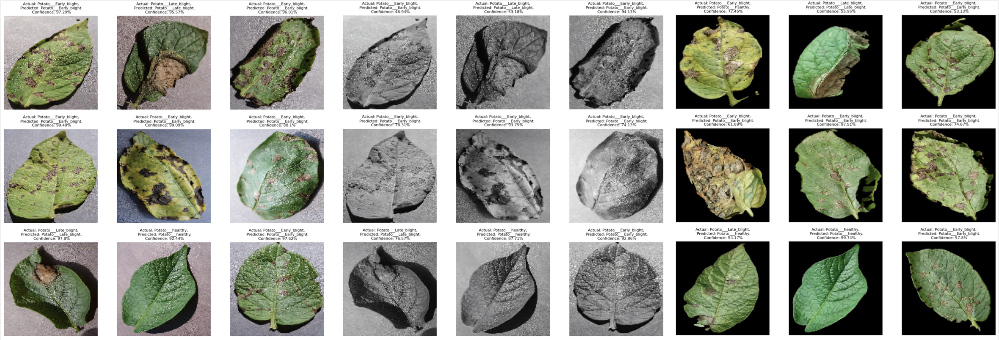

# Inhaltsverzeichnis
 
[1. Datenaufbereitung](#chapter1) <br>
[2. Train-Test-Split](#chapter2)<br>
[3. Modellwahl - CNN](#chapter3)<br>
[4. Ergebnisse](#chapter4)<br>
[5. Modell mit Grayscale Data](#chapter5)<br>
[6. Modell mit Segmented Data](#chapter6)<br>
[7. Auswertung und Diskussion](#chapter7)<br>

## 1. Dartenaufbereitung <a class="anchor" id="chapter1"></a> ##

In [102]:
import numpy as np # mathematische Operationen
import pandas as pd # Bib für Datenmanipulation
import os # Dateipfade durchgehen (für Daten Laden) 
import seaborn as sns # Bib für Grafiken und Diagramme
import matplotlib.pyplot as plt # Visualisierung von Python Daten

# Für das CNN und Datenaufbereitung
import tensorflow as tf 
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.models import Sequential 
from tensorflow.keras.optimizers import Adam, Adamax 
from tensorflow.keras.layers import BatchNormalization, Dense, Dropout
from sklearn.model_selection import train_test_split 

In [104]:
#Für die Ausführung in der Google Colab Umgebung, muss data erstezt werden durch folgenden Code: 
#from google.colab import drive
#drive.mount('/content/drive')
#data = '/content/drive/MyDrive/Colab Notebooks/plant_color'
data = 'plant_color'

def create_dataframe(data_path):
    filepaths = []
    labels = []
    folds = os.listdir(data_path)
    
    for fold in folds:
        f_path = os.path.join(data_path, fold)
        
        if os.path.isdir(f_path):
            imgs = os.listdir(f_path)
            
            for img in imgs:
                img_path = os.path.join(f_path, img)
                
                if os.path.isfile(img_path):
                    filepaths.append(img_path)
                    labels.append(fold)

    fseries = pd.Series(filepaths, name='Filepaths')
    lseries = pd.Series(labels, name='Labels')
    return pd.concat([fseries, lseries], axis=1)
df = create_dataframe(data)

Der ursprüngliche PlantVillage-Ordner umfasst die drei Hauptordner "color", "grey" und "segmented" mit jeweils 38 Ordnern, welche die verschiedenen Pflanzenarten und Gesundheitszustände repräsentieren. Die Dauer des Trainings einer einzigen Epoche und lediglich eines der Hauptordner auf meinem MacBook Air mit M1-Chip beträgt zweieinhalb Stunden. Da ich jedoch viel mehr vorhabe, behalte ich pro Hauptordner nur die drei Ordner *Potato_Early_blight, Potato_Late_blight und Potato_healthy*. Die Auswahl dieser drei Ordner basiert auf der Anzahl der enthaltenen Bilder, denn zwei enthalten jeweils 1000 Bilder und einer nur 152. Damit kann untersucht werden, ob eine ungleiche Verteilung sich negativ auf die Vorhersagen auswirkt. Das folgende Diagramm zeigt die ursprüngliche Struktur mit 54303 Bildern pro Hauptordner: 

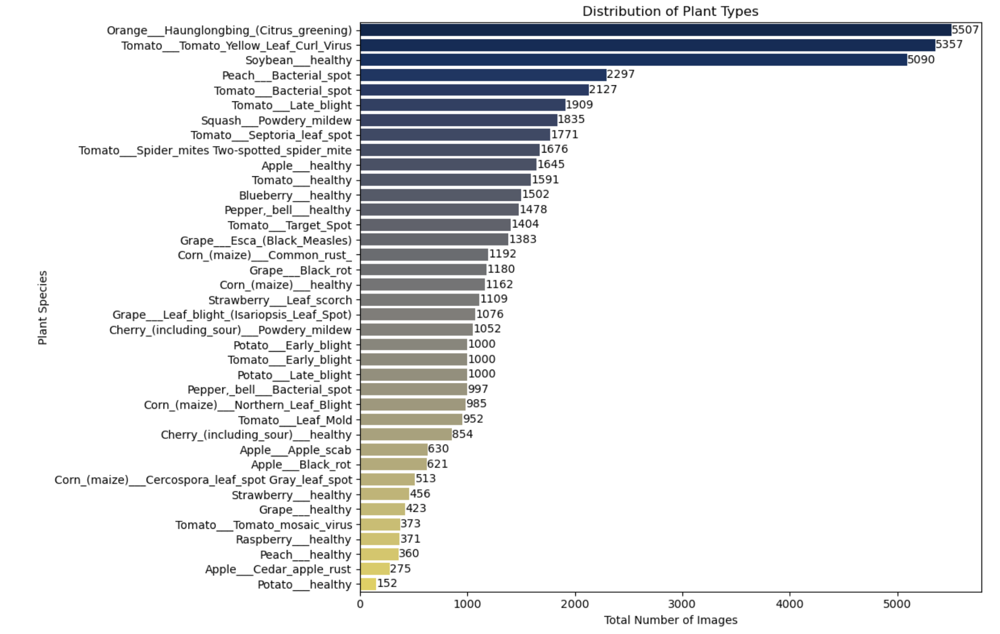

Hier sind nun die drei Ordner abgebildet, die im Weiteren Verlauf genutzt werden (102 MB an Bildern), als Diagramm und dazu einige Beispielbilder. 

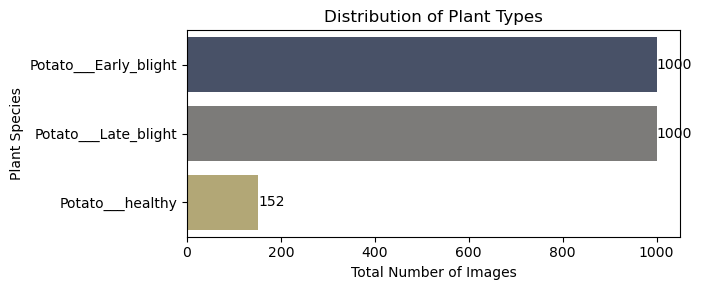

In [12]:
counts_sorted = df['Labels'].value_counts()
plt.figure(figsize=(7, 3))
sns.barplot(x=counts_sorted.values, y=counts_sorted.index, orient='h', palette='cividis')
plt.title('Distribution of Plant Types')
plt.xlabel('Total Number of Images')
plt.ylabel('Plant Species')
plt.tight_layout()

for index, value in enumerate(counts_sorted):
    plt.text(value + 0.5, index, str(value), va='center', color='black')
plt.show()

Found 2152 files belonging to 3 classes.


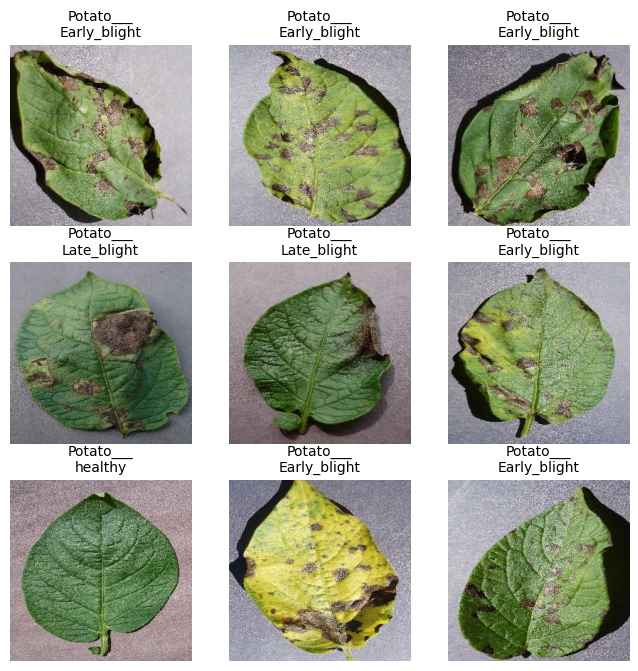

In [40]:
# mehr dazu https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image_dataset_from_directory
data = tf.keras.preprocessing.image_dataset_from_directory(
    data,
    image_size=(256, 256),
    batch_size=16 
)
class_names = data.class_names

plt.figure(figsize=(8, 8))
for image_batch, labels_batch in data.take(1):
    num_images = min(len(image_batch), 9)
    for i in range(num_images):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        title_text = class_names[labels_batch[i].numpy()]
        split_index = title_text.find("___")
        if split_index != -1:
            title_text = title_text[:split_index + 3] + "\n" + title_text[split_index + 3:]
        plt.title(title_text, fontsize=10)
        plt.axis("off")
plt.show()

Es bestehen drei große Herausforderungen mit diesem Dataset: 
1. Es gibt Bilder die falsch gelabeled wurden (siehe die nächsten beiden Bilder) 
2. Die Differenzierung zwischen Early_blight und Late_blight ist manchmal nicht eindeutig
3. Es gibt unterschiedliche Hintergrundfarben und in manchen Bildern gibt es (starken) Schatten, in manchen gar keinen 

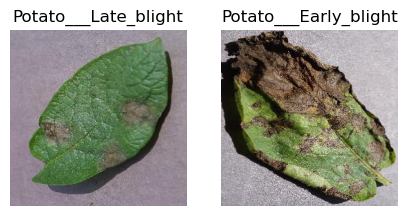

In [71]:
#nicht gehardcoded, es wird selbständig herausgefunden was das Label ist
fig, ax = plt.subplots(1, 2, figsize=(5, 5))

i = df[df['Filepaths'].str.contains("1b8ae46e-1202-4715-8ad1-fd18046c42d3___RS_LB 3880.JPG")]
ax[0].imshow(plt.imread(i['Filepaths'].values[0]))
ax[0].set_title(i['Labels'].values[0])
ax[0].axis('off')

j = df[df['Filepaths'].str.contains("201fed44-8dde-4ece-9e76-3706b8afdf46___RS_Early.B 8259.JPG")]
ax[1].imshow(plt.imread(j['Filepaths'].values[0]))
ax[1].set_title(j['Labels'].values[0])
ax[1].axis('off')

plt.show()

## 2. Train-Test-Split <a class="anchor" id="chapter2"></a> ##

In [33]:
train_df, temp_df = train_test_split(df, train_size=0.8, shuffle=True, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, shuffle=True, random_state=42)                                     
#Training = 80%
#valid = 10% (50% von den restlichen 0,2)
#test = 10% (50% von den restlichen 0,2)                             

Um die Generalisierungsfähigkeit zu erhöhen und Overfitting zu vermeiden, kann man Augmentationstechniken verwenden. Dabei werden die Bilder mit leichten Veränderungen (z.B. gedreht/rotiert, skaliert, gespiegelt) kopiert und in den Trainingsdatensatz miteingefügt. 
Mehr zum Thema hier: ["Data Augmentation Techniques in CNN using Tensorflow"](https://medium.com/ymedialabs-innovation/data-augmentation-techniques-in-cnn-using-tensorflow-371ae43d5be9). Außerdem kann die Effektivität des Modells erhöht werden, indem die ursprünglichen Pixelwerte zwischen 0 und 255 reskaliert werden zu 0 bis 1 $^{1}$. 

Kurze Begriffserklärung: Epochen ist die Anzahl der Durchläufe mit dem gesamten Trainingsdatensatz (forward und backward propagation), wobei jedes Mal die Gewichte mit dem Gradient descent angepasst werden (hier wird 'Adamax' mit einer learning_rate=0.001 verwendet). Es wird von Underfitting zu Optimum zu Overfitting gewechselt - die Anzahl muss also mit Bedacht gewählt werden. Batch Size ist die Gesamtanzahl an Trainingsbeispielen in einem Batch (die Daten werden in mehrere Batches aufgeteilt, da nicht die gesamten Daten in ein neuronales Netz passen). Iterationen ist die Anzahl der Batches, die benötigt werden, um eine Epoche durchzuführen (die Anzahl der Batches entspricht der Anzahl der Iterationen für eine Epoche). Beispiel: Wir können den Datensatz von 2000 Beispielen in Batches von 500 aufteilen, dann werden 4 Iterationen benötigt, um 1 Epoche abzuschließen.

In [36]:
#https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator
def create_image_data_generators():
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    valid_datagen = ImageDataGenerator(rescale=1./255)
    test_datagen = ImageDataGenerator(rescale=1./255)

    return train_datagen, valid_datagen, test_datagen


def create_generators(train_df, val_df, test_df, train_datagen, valid_datagen, test_datagen):
    target_size_parameter = (128, 128)  # Bildgröße
    batch_size_parameter = 16  # Batchgröße

    train_generator = train_datagen.flow_from_dataframe(
        dataframe=train_df,
        x_col='Filepaths',
        y_col='Labels',
        target_size=target_size_parameter,
        batch_size=batch_size_parameter,
        class_mode='categorical',
        shuffle=True,
        seed=42
    )

    valid_generator = valid_datagen.flow_from_dataframe(
        dataframe=val_df,
        x_col='Filepaths',
        y_col='Labels',
        target_size=target_size_parameter,
        batch_size=batch_size_parameter,
        class_mode='categorical',
        shuffle=True,
        seed=42
    )

    test_generator = test_datagen.flow_from_dataframe(
        dataframe=test_df,
        x_col='Filepaths',
        y_col='Labels',
        target_size=target_size_parameter,
        batch_size=batch_size_parameter,
        class_mode='categorical',
        shuffle=False,
        seed=42
    )
    return train_generator, valid_generator, test_generator

    
train_datagen, valid_datagen, test_datagen = create_image_data_generators()
train_generator, valid_generator, test_generator = create_generators(
    train_df, val_df, test_df, 
    train_datagen, valid_datagen, test_datagen
)

Found 1721 validated image filenames belonging to 3 classes.
Found 215 validated image filenames belonging to 3 classes.
Found 216 validated image filenames belonging to 3 classes.


## 3. Modellwahl - CNN <a class="anchor" id="chapter3"></a>

Unter den vielen ML/DL-Modellen die es heute gibt, ist die Entscheidung für dennoch CNN eindeutig, da es sich als leistungsstarker Standard für Bildklassifikation etabliert hat. Die Funktionsweise dieses neuronalen Netzes entspricht der Arbeitsweise unseres Gehirns bei visuellen Wahrnehmungen. Erst erkennt es durch Partitionierung einzelne Bestandteile des Ganzen (Bildes) und aggregiert diese dann wieder zusammen, um dann zu entscheiden was es sieht. Hierzu ein High-Level Beispiel: Dem Gehirn ist die Wahrnehmung eines Pandas möglich, indem zunächst die Farbe, die Ohren, die Augen, die Nase, der Mund sowie die Größe des Kopfes als charakteristische Merkmale eines Pandas identifiziert werden. Im Anschluss werden die Arme, Hände, Beine und der Bauch als weitere pandatypische Körpermerkmale erkannt und schließlich zu einem Gesamtbild eines Pandas aggregiert$^{2}$. In den meisten Fällen erfolgt die Wahrnehmung dieser Prozesse so schnell, dass sie nicht bewusst wahrgenommen werden. Erst bei der Betrachtung neuer Objekte wird man sich diesem bewusst.  

Was ist aber, wenn der Panda nicht im Zentrum des Bildes ist, sondern links, rechts oder in der Ecke? Genau dieses Problem haben einfache neuronale Netze. Artificial Neural Network war der Vorgänger,  der es größtenteils schaffte,  auch Bilder mit Varianz in Position der Subjekte korrekt zu klassifizieren. Aufgrund der enormen Rechenkapazität, die ANNs aber benötigten$^{3}$, wurden diese von CNNs mit Augmentationstechniken abgelöst. Die Convolutional Layers verwenden Filter (Kernels), die über das gesamte Bild gleiten und lokale Merkmale wie Kanten, Texturen und kleine Strukturen erkennen. Sie sind also in der Lage, dieselben Merkmale überall im Bild zu identifizieren, unabhängig von der Position. Für die Mathematik hinter CNNs empfehle ich [dieses Video](https://www.youtube.com/watch?v=Lakz2MoHy6o). 

Unter den convolutional neural network gibt es wieder eine große Auswahl an Architekturen, welche je nach Anwendungsgebiet unterschiedlich effizient sind.
[LeNet 1](https://www.youtube.com/watch?v=FwFduRA_L6Q) stellt mit 9760 Parametern eines der ersten CNN x Computer-Vision-Modelle überhaupt dar, welches im Jahr 1989 entwickelt wurde und die Grundlage für die heutigen Modelle legte.  
Im Jahr 2012 erreichte einer der Mitbegründer von OpenAI (Ilya Sutskever) einen weiteren sehr bedeutenden Meilenstein mit dem [ImageNet](https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf), das über 60 Millionen Parameter verfügt. [The moment we stopped understanding AI](https://www.youtube.com/watch?v=UZDiGooFs54) ist eine exzellente Erklärung zu diesem Paper als YouTube-Video.  Das ImageNet stellt keine CNN-Architektur dar, sondern eine umfangreiche Bilddatenbank, auf deren Basis CNN-Architekturen wie AlexNet, VGGNet, GoogLeNet und ResNet trainiert wurden. Zwei weitere namenhafte Bilddatenbanken sind COCO und ISIC. Welche Architektur man letztendlich wählt, hängt von zu vielen Faktoren ab, sodass eine übersichtliche Darstellung an dieser Stelle nicht (für mich) möglich ist. Ein typischer Ansatz für Anfänger ist es, zwischen den meistverwendeten Architekturen (ResNet, VGGNet, GoogLeNet) auszuwählen, die Parameter anzupassen und diejenige mit den besten Ergebnissen zu wählen.

In einer im Jahr 2023 veröffentlichten [Paper](https://www.researchgate.net/publication/376415019_Detecting_Plant_Disease_Using_CNN_and_KNN) wurden verschiedene Deep-Learning-Architekturen, darunter AlexNet, GoogLeNet, ResNet50, InceptionV2 und DenseNet161, anhand desselben Datensatzes evaluiert. Überraschenderweise hatte das GoogleNet (1. Platz), welches nur über 5 Millionen Parameter verfügt, eine Accuracy von 99.34%, während das AlexNet mit 60 Millionen Parameter nur 85.53% (3. Platz) erreichte. Da diese Ergebnisse erst nach 30 Epochen erzielt wurden, suchte ich nach effizienteren Architekturen. Nach ausgiebiger Recherche und Trial-and-Error wählte ich Xception (23 Millionen Parameter, auch trainiert mit ImageNet) und verwendete die "Tanh"-Aktivierungsfunktion. ([Hier](https://www.analyticsvidhya.com/blog/2020/01/fundamentals-deep-learning-activation-functions-when-to-use-them/?utm_source=blog&utm_medium=mathematics-convolutional-neural-network#h-overview-of-activation-function-in-neural-networks) eine Übersicht und Erklärungen anderer Aktivierungsfunktionen). Dieses erzielt eine Accuracy von 99% mit nur drei Epochen und sechs Minuten Durchlaufzeit.   

In [39]:
def create_and_train_model(train_generator, valid_generator):
    base_model = tf.keras.applications.Xception(weights='imagenet', include_top=False, input_shape=(128, 128, 3), pooling='avg')
    model = Sequential([
        base_model,
        BatchNormalization(),  # Normaliiserung der Eingaben einer Schicht
        Dense(256, activation='tanh'),  # Anzahl Neuronen und Aktivierungsfunktion der Eingabeschicht
        Dropout(0.5),  # Regulariserungstechnik um Overfitting zu vermeiden
        Dense(3, activation='softmax')  # Anzahl Neuronen und Aktivierungsfunktion der Ausgabeschicht, Anzahl Ordner!
    ])
    model.compile(optimizer=Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(
        x=train_generator,
        validation_data=valid_generator,
        epochs=6, 
        verbose=1
    )
    return model, history

model, history = create_and_train_model(train_generator, valid_generator) 

Epoch 1/6


/opt/anaconda3/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


108/108 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.7798 - loss: 0.6457 - val_accuracy: 0.8884 - val_loss: 0.2934
Epoch 2/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 118s 1s/step - accuracy: 0.9324 - loss: 0.1954 - val_accuracy: 0.9814 - val_loss: 0.0619
Epoch 3/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - accuracy: 0.9711 - loss: 0.0799 - val_accuracy: 0.9907 - val_loss: 0.0237
Epoch 4/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 130s 1s/step - accuracy: 0.9838 - loss: 0.0476 - val_accuracy: 0.9907 - val_loss: 0.0258
Epoch 5/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 136s 1s/step - accuracy: 0.9867 - loss: 0.0357 - val_accuracy: 0.9814 - val_loss: 0.0544
Epoch 6/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - accuracy: 0.9744 - loss: 0.0872 - val_accuracy: 0.9767 - val_loss: 0.0557


Es kann vorkommen, dass trotz höherer Werte eine Metrik schlechter ausfällt als mit weniger. Die Bildgröße ist ein Beispiel, dass mehr nicht immer zwangsweise besser sein muss, und die Gründe dafür sind äußerst interessant. Die Änderung der Bildgröße von 128 auf 256 Pixel kann dazu führen, dass mehr Details im Bild erkannt werden. Das Modell könnte übermäßig viele Details lernen, die nicht immer nützlich sind und sich negativ auf die Validierungsgenauigkeit auswirken. <br>
Ich habe viele verschiedene Architekturen, Aktivierungsfunktionen und Größen ausprobiert, um das Modell zu optimieren. 
Hier sind vier Beispiele mit unterschiedlichen Parameterwerten: 

4 Epochen mit der ReLu Aktivierungsfunktion <br>
Batch Size 16: 81/81 ━━━━━━━━━━━━━━━━━━━━ 107s 1s/step - accuracy: 0.9135 - loss: 0.2059 - val_accuracy: 0.9163 - val_loss: 0.5124

Batch Size 32: 41/41 ━━━━━━━━━━━━━━━━━━━━ 108s 3s/step - accuracy: 0.9777 - loss: 0.0635 - val_accuracy: 0.9558 - val_loss: 0.2285

6 Epochen mit der Tanh Aktivierungsfunktion <br>
Batch Size 16: 81/81 ━━━━━━━━━━━━━━━━━━━━ 14s 167ms/step - accuracy: 0.9541 - loss: 0.1920 - val_accuracy: 0.9674 - val_loss: 0.0780

Batch Size 32: 41/41 ━━━━━━━━━━━━━━━━━━━━ 130s 3s/step - accuracy: 0.9895 - loss: 0.0393 - val_accuracy: 0.9962 - val_loss: 0.0051

## 4. Ergebnisse <a class="anchor" id="chapter4"></a> ## 

In [42]:
def evaluate_and_print(model, test_generator):
    test_loss, test_accuracy = model.evaluate(test_generator, verbose=1)
    print(f"Test Loss: {test_loss:.4f}")
    print(f"Test Accuracy: {test_accuracy:.4f}")

evaluate_and_print(model, test_generator)

/opt/anaconda3/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 184ms/step - accuracy: 0.9939 - loss: 0.0292
Test Loss: 0.0358
Test Accuracy: 0.9907


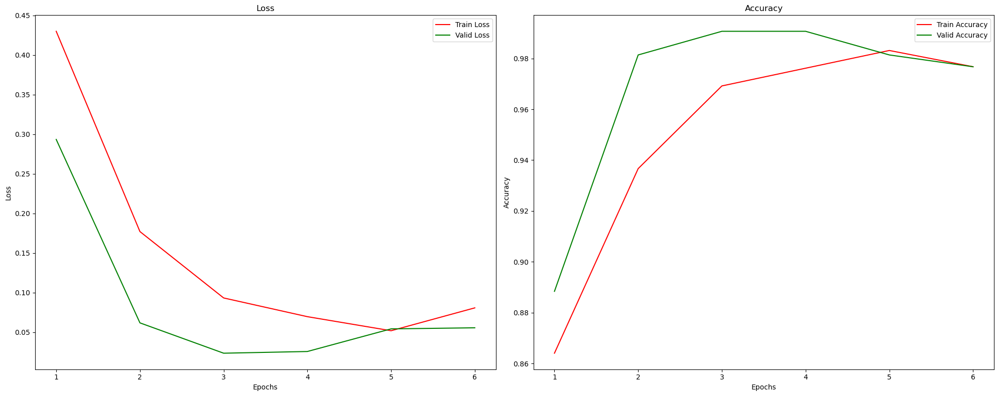

In [44]:
def plot_training_history(history):
    tr_acc = history.history['accuracy']
    tr_loss = history.history['loss']
    val_acc = history.history['val_accuracy']
    val_loss = history.history['val_loss']

    epochs = [i + 1 for i in range(len(tr_acc))]

    plt.figure(figsize=(20, 8))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, tr_loss, 'r', label='Train Loss')
    plt.plot(epochs, val_loss, 'g', label='Valid Loss')
    plt.title('Loss')
    plt.legend()
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.subplot(1, 2, 2)
    plt.plot(epochs, tr_acc, 'r', label='Train Accuracy')
    plt.plot(epochs, val_acc, 'g', label='Valid Accuracy')
    plt.title('Accuracy')
    plt.legend()
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.tight_layout()
    plt.show()

plot_training_history(history)

Diese Diagramme zeigen die Ergebnisse der einzelnen Epochen für meinen aktuellen Durchlauf. Die Werte ändern sich mit jedem Durchlauf des Notebooks. In diesem Fall liefert die dritte bis vierte Epoche die besten Ergebnisse. Warum das so sein könnte, wurde bereits bei der Definition der Epochen erklärt. Es muss ein Mittelweg gefunden werden, um sowohl eine Unter- als auch eine Überanpassung zu vermeiden. 

14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 185ms/step - accuracy: 0.9939 - loss: 0.0292
Test Loss: 0.0358
Test Accuracy: 0.9907
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


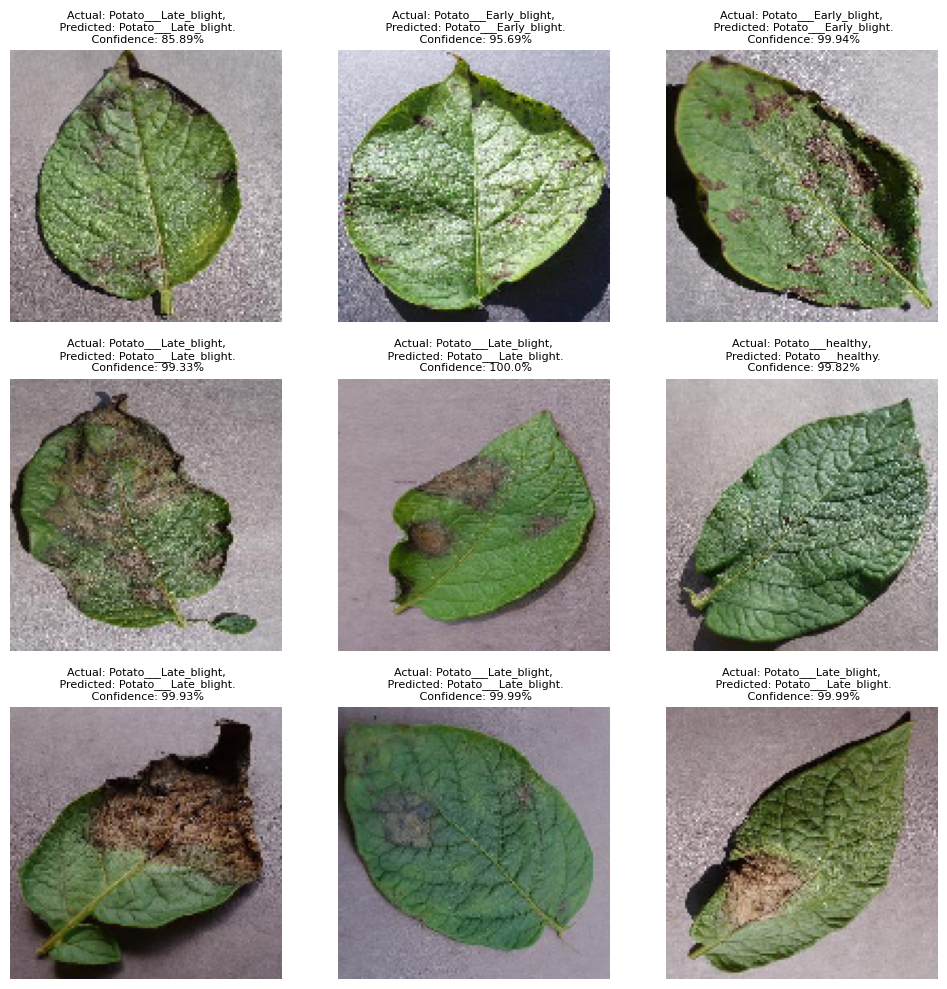

In [46]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img) 
    img_array = tf.expand_dims(img_array, 0)
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])] 
    confidence = round(100 * np.max(predictions[0]), 2)  
    return predicted_class, confidence
class_names = list(train_generator.class_indices.keys())  
test_loss, test_accuracy = model.evaluate(test_generator, verbose=1)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
images, labels = next(test_generator)

def plot_predictions(model, images, labels, class_names):
    plt.figure(figsize=(10, 10)) 
    for i in range(min(9, len(images))): 
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i]) 
        predicted_class, confidence = predict(model, images[i]) 
        actual_class = class_names[np.argmax(labels[i])] 
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%", fontsize=8)
        plt.axis("off")
    
    plt.tight_layout()  
    plt.show()
plot_predictions(model, images, labels, class_names)

In [48]:
# Überprüfen der Verteilung der Klassen im Testdatensatz
class_distribution = test_df['Labels'].value_counts()
print(class_distribution)

Labels
Potato___Early_blight    97
Potato___Late_blight     95
Potato___healthy         24
Name: count, dtype: int64


In [52]:
from sklearn.metrics import confusion_matrix

# Generiere Vorhersagen für den Testdatensatz
predictions = model.predict(test_generator)
y_pred_classes = np.argmax(predictions, axis=1)  # Index der höchsten Wahrscheinlichkeit für jede Vorhersage
y_true = test_generator.classes  # tatsächliche Klassen aus dem Testgenerator

# Sicherstellen, dass alle Klassen im Output vorhanden sind
class_labels = list(train_generator.class_indices.keys())

# Erstellen der Konfusionsmatrix unter Berücksichtigung aller Klassen
conf_mat = confusion_matrix(y_true, y_pred_classes, labels=np.arange(len(class_labels)))

#plt.figure(figsize=(7, 4))
#sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
#plt.xlabel('Predicted Label')
#plt.ylabel('True Label')
#plt.title('Confusion Matrix')

14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 193ms/step


Da das Jupyter Notebook die Confusion-Matrix öfters nicht korrekt anzeigt, habe ich im Anhang ein Screenshot beigefügt, welches ich aus meiner Google Colab Ausführung habe. Da jeder Durchlauf variert, sind die Zahlen hierzusehen nicht identisch mit tatsächlichen zu diesem. 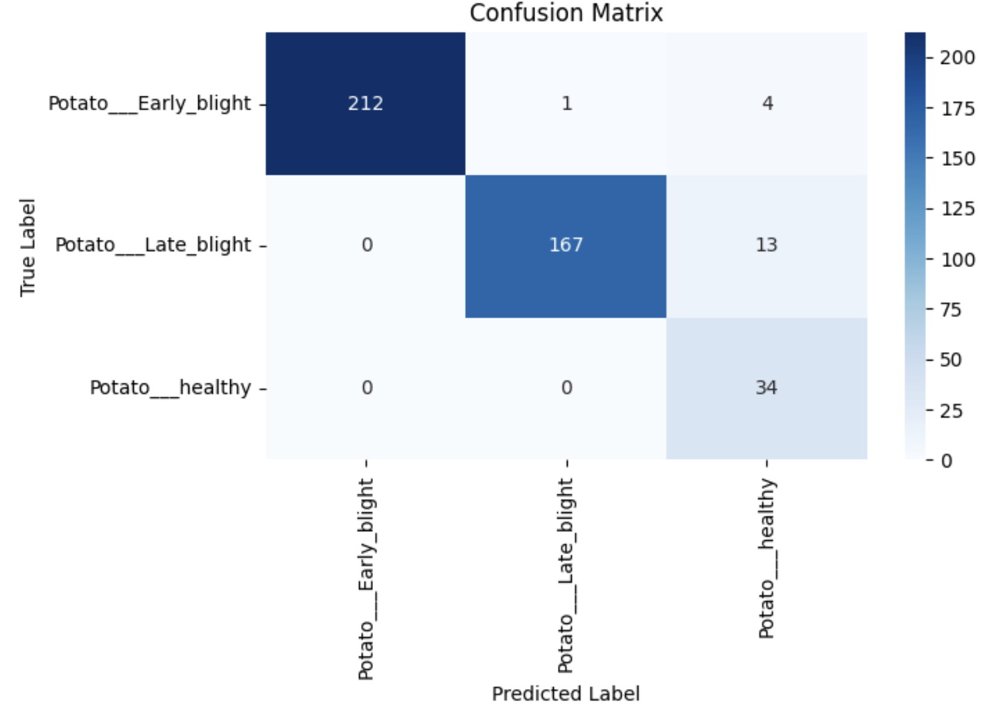

Die Confusion Matrix zeigt die tatsächlichen Labels (True Labels) auf der y-Achse und die vorhergesagten Labels (Predicted Labels) auf der x-Achse. Auf der hervorgehobenen Diagonalen befinden sich die korrekt klassifizierten Beispiele und außerhalb sind die falsch klassifizierten. Ich werde zum Schluss auf die Ergebnisse der Confusion Matrix eingegangen, um die Frage der ungleichmäßig verteilten Daten zu beantworten. 

In [54]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred_classes, target_names=class_labels))

                       precision    recall  f1-score   support

Potato___Early_blight       0.99      1.00      0.99        97
 Potato___Late_blight       1.00      0.98      0.99        95
     Potato___healthy       0.96      1.00      0.98        24

             accuracy                           0.99       216
            macro avg       0.98      0.99      0.99       216
         weighted avg       0.99      0.99      0.99       216



<br>
<br>
<br>
<br>


<p style="text-align: center; font-size: 24px; font-weight: bold;">Zweiter Teil</p>
Nach einer ausführlichen Beschreibung der Farbbilder wird die Darstellung der Graubilder und der Segmentbilder minimalistisch gehalten, da der Ablauf identisch ist. Aus diesem Grund wurden Teile des Codes in Funktionen geschrieben, um sie im Folgenden wiederverwenden zu können. Nachdem alle drei Varianten des Datensatzes mit dem gleichen (aber seperaten) Modell trainiert wurden, erfolgt in Abschnitt sieben der Vergleich und die Auswertung, um den zweiten Teil der Arbeit zu beantworten. 

## 5. Modell mit Grayscale Data <a class="anchor" id="chapter5"></a>

In [31]:
#data = '/content/drive/MyDrive/Colab Notebooks/plant_grayscale'
data = 'plant_grayscale'

def create_dataframe(data_path):
    filepaths = []
    labels = []
    folds = os.listdir(data_path)
    
    for fold in folds:
        f_path = os.path.join(data_path, fold)
        
        if os.path.isdir(f_path):
            imgs = os.listdir(f_path)
            
            for img in imgs:
                img_path = os.path.join(f_path, img)
                
                if os.path.isfile(img_path):
                    filepaths.append(img_path)
                    labels.append(fold)

    fseries = pd.Series(filepaths, name='Filepaths')
    lseries = pd.Series(labels, name='Labels')
    return pd.concat([fseries, lseries], axis=1) 
df = create_dataframe(data)
data = tf.keras.preprocessing.image_dataset_from_directory(
    data,
    image_size=(256, 256),
    batch_size=16
)
class_names = data.class_names

train_df, temp_df = train_test_split(df, train_size=0.8, shuffle=True, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, shuffle=True, random_state=42)      

train_datagen, valid_datagen, test_datagen = create_image_data_generators()
train_generator, valid_generator, test_generator = create_generators(
    train_df, val_df, test_df, 
    train_datagen, valid_datagen, test_datagen
)
    
model, history = create_and_train_model(train_generator, valid_generator) 

Found 2152 files belonging to 3 classes.
Found 1721 validated image filenames belonging to 3 classes.
Found 215 validated image filenames belonging to 3 classes.
Found 216 validated image filenames belonging to 3 classes.
Epoch 1/6


/opt/anaconda3/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


108/108 ━━━━━━━━━━━━━━━━━━━━ 197s 2s/step - accuracy: 0.6738 - loss: 1.0267 - val_accuracy: 0.8605 - val_loss: 0.4032
Epoch 2/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 178s 2s/step - accuracy: 0.8661 - loss: 0.4527 - val_accuracy: 0.8140 - val_loss: 0.5615
Epoch 3/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 168s 2s/step - accuracy: 0.8882 - loss: 0.3141 - val_accuracy: 0.7442 - val_loss: 0.7796
Epoch 4/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.9077 - loss: 0.2411 - val_accuracy: 0.8744 - val_loss: 0.3587
Epoch 5/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - accuracy: 0.9312 - loss: 0.2111 - val_accuracy: 0.9023 - val_loss: 0.3408
Epoch 6/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - accuracy: 0.9297 - loss: 0.2170 - val_accuracy: 0.9395 - val_loss: 0.2267


In [32]:
evaluate_and_print(model, test_generator)

14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 234ms/step - accuracy: 0.9162 - loss: 0.3791
Test Loss: 0.2628
Test Accuracy: 0.9352


14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - accuracy: 0.9162 - loss: 0.3791
Test Loss: 0.2628
Test Accuracy: 0.9352
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


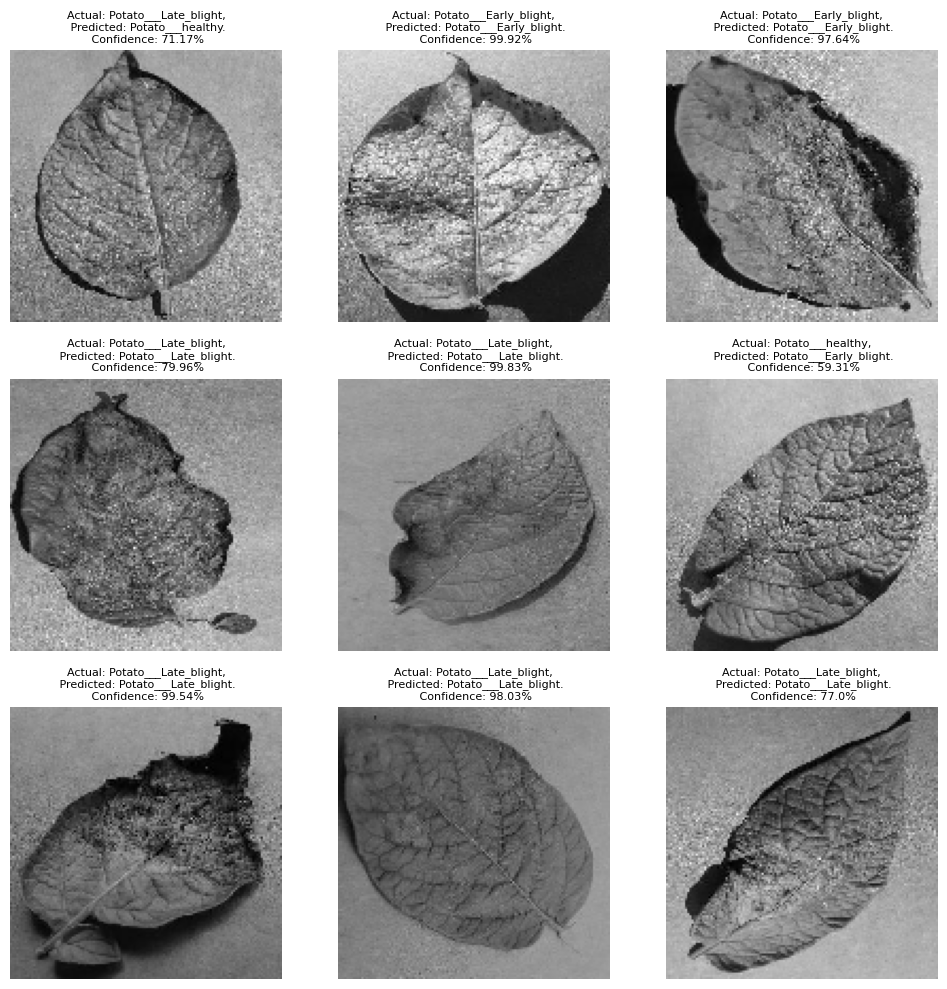

In [33]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)  
    img_array = tf.expand_dims(img_array, 0)  
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]  
    confidence = round(100 * np.max(predictions[0]), 2)  
    return predicted_class, confidence

class_names = list(train_generator.class_indices.keys()) 
test_loss, test_accuracy = model.evaluate(test_generator, verbose=1)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
images, labels = next(test_generator)
plot_predictions(model, images, labels, class_names)

## 6. Modell mit Segmented Data <a class="anchor" id="chapter6"></a>  

In [35]:
#data = '/content/drive/MyDrive/Colab Notebooks/plant_segmented'
data = 'plant_segmented'

def create_dataframe(data_path):
    filepaths = []
    labels = []
    folds = os.listdir(data_path)
    
    for fold in folds:
        f_path = os.path.join(data_path, fold)
        
        if os.path.isdir(f_path):
            imgs = os.listdir(f_path)
            
            for img in imgs:
                img_path = os.path.join(f_path, img)
                
                if os.path.isfile(img_path):
                    filepaths.append(img_path)
                    labels.append(fold)

    fseries = pd.Series(filepaths, name='Filepaths')
    lseries = pd.Series(labels, name='Labels')
    return pd.concat([fseries, lseries], axis=1)
df = create_dataframe(data)
data = tf.keras.preprocessing.image_dataset_from_directory(
    data,
    image_size=(256, 256),
    batch_size=16
)
class_names = data.class_names

train_df, temp_df = train_test_split(df, train_size=0.8, shuffle=True, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, shuffle=True, random_state=42)      

train_datagen, valid_datagen, test_datagen = create_image_data_generators()
train_generator, valid_generator, test_generator = create_generators(
    train_df, val_df, test_df, 
    train_datagen, valid_datagen, test_datagen
)
    
model, history = create_and_train_model(train_generator, valid_generator) 

Found 2152 files belonging to 3 classes.
Found 1721 validated image filenames belonging to 3 classes.
Found 215 validated image filenames belonging to 3 classes.
Found 216 validated image filenames belonging to 3 classes.
Epoch 1/6


/opt/anaconda3/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


108/108 ━━━━━━━━━━━━━━━━━━━━ 127s 1s/step - accuracy: 0.7333 - loss: 0.7993 - val_accuracy: 0.8000 - val_loss: 0.5382
Epoch 2/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - accuracy: 0.9330 - loss: 0.2346 - val_accuracy: 0.9442 - val_loss: 0.1189
Epoch 3/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 125s 1s/step - accuracy: 0.9583 - loss: 0.1196 - val_accuracy: 0.9860 - val_loss: 0.0342
Epoch 4/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - accuracy: 0.9780 - loss: 0.0787 - val_accuracy: 0.9907 - val_loss: 0.0314
Epoch 5/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 146s 1s/step - accuracy: 0.9901 - loss: 0.0318 - val_accuracy: 0.9953 - val_loss: 0.0129
Epoch 6/6
108/108 ━━━━━━━━━━━━━━━━━━━━ 153s 1s/step - accuracy: 0.9789 - loss: 0.0706 - val_accuracy: 1.0000 - val_loss: 0.0264


In [36]:
evaluate_and_print(model, test_generator)

14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 274ms/step - accuracy: 0.9956 - loss: 0.0174
Test Loss: 0.0224
Test Accuracy: 0.9954


14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 289ms/step - accuracy: 0.9956 - loss: 0.0174
Test Loss: 0.0224
Test Accuracy: 0.9954
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


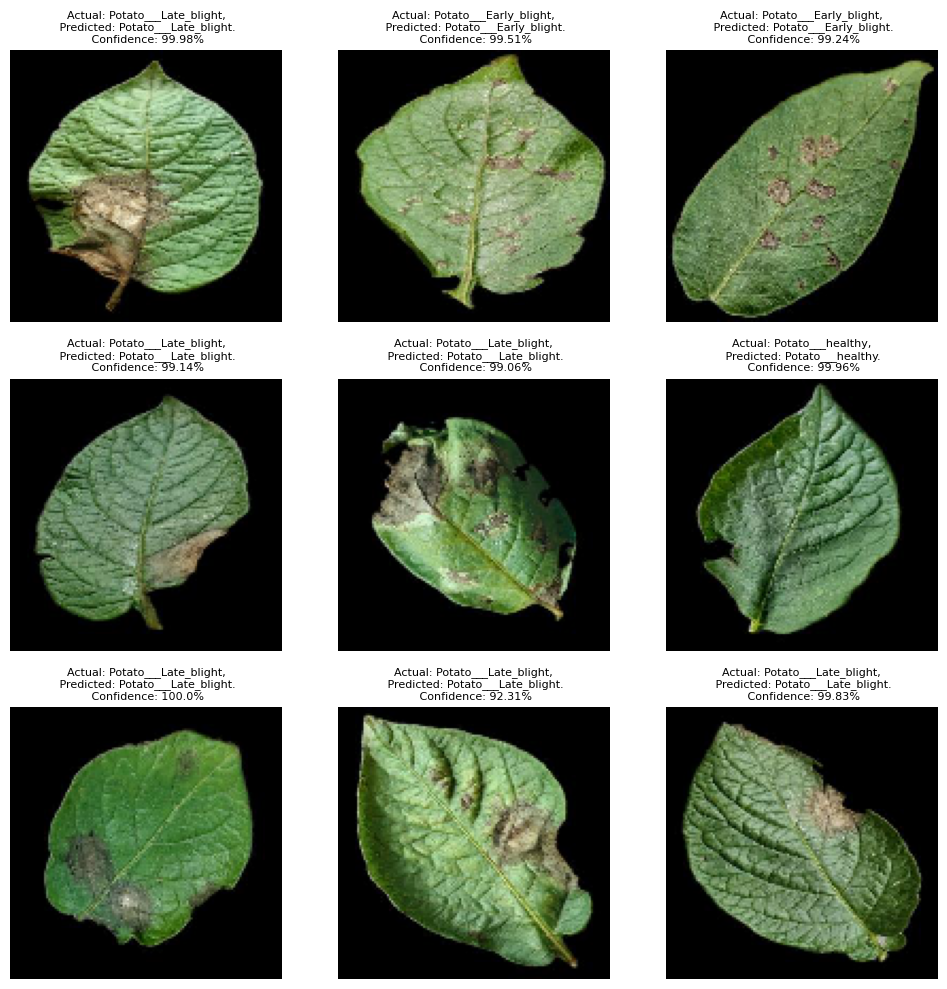

In [37]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)  
    img_array = tf.expand_dims(img_array, 0)  
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]  
    confidence = round(100 * np.max(predictions[0]), 2)  
    return predicted_class, confidence

class_names = list(train_generator.class_indices.keys()) 
test_loss, test_accuracy = model.evaluate(test_generator, verbose=1)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
images, labels = next(test_generator)
plot_predictions(model, images, labels, class_names)

## 7. Auswertung und Diskussion <a class="anchor" id="chapter7"></a>  

Da die Resultate bei jedem Durchlauf in geringfügig variierender Form vorliegen (mal color, mal segmented als optimale Lösung), wurden folgende Funktionen implementiert, um die Hervorhebung automatisch zu bewerkstelligen. Der kleinste Wert beim loss und der größte Wert bei Accuracy wird grün ausgegeben. 

In [22]:
data = {
    'Data': ['Color', 'Grayscale', 'Segmented'],
    'Test Loss': [0.0872, 0.2628, 0.0224],
    'Test Accuracy': [0.9722, 0.9352, 0.9954]
}

df = pd.DataFrame(data)
df['Test Loss'] = df['Test Loss'] * 100
df['Test Accuracy'] = df['Test Accuracy'] * 100

def color_min_text(val, col):
    color = 'green' if val == df[col].min() else 'black'
    return f'color: {color}'
def color_max_text(val, col):
    color = 'green' if val == df[col].max() else 'black'
    return f'color: {color}'
df.style.format({
    'Test Loss': '{:.2f}%',
    'Test Accuracy': '{:.2f}%'
}).apply(lambda x: x.map(lambda val: color_min_text(val, 'Test Loss')), subset=['Test Loss']) \
  .apply(lambda x: x.map(lambda val: color_max_text(val, 'Test Accuracy')), subset=['Test Accuracy'])

,Data,Test Loss,Test Accuracy
0,Color,8.72%,97.22%
1,Grayscale,26.28%,93.52%
2,Segmented,2.24%,99.54%


Die besten Resultate wurden mit den Color und Segmented  Bilddaten erzielt. Dies ist darauf zurückzuführen, dass bei der Objekterkennung primär die Pflanze von Interesse ist, während der Hintergrund als irrelevantes Rauschen betrachtet wird und keine signifikanten Informationen zur Klassifizierung liefert. Farbige Bilder lieferten gute Ergebnisse aufgrund der zusätzlichen Farbinformationen, die dem Modell halfen, bedeutende Merkmale, wie die dunkele Verfärbung bei Krankheiten, besser zu erkennen. In Szenarien, in denen die Hauptaufgabe die Erkennung von Mustern und Texturen ist und Farbinformationen irrelevant sind, kann die Verwendung von Graustufenbildern jedoch vorteilhaft sein, da sie den Speicherplatzbedarf und Rechenleistung reduzieren, die für die Verarbeitung und Analyse der Bilder erforderlich ist $^{5,  6}$.

Die Wahl zwischen segmentierten und nicht-segmentierten (originalen) Bilddaten hängt vom spezifischen Anwendungsfall ab. In der vorliegenden Untersuchung stellt der Hintergrund lediglich störendes Rauschen dar. Für die Erkennung von Pflanzenkrankheiten ist es nicht notwendig, den Hintergrund zu berücksichtigen, da dieser keine relevanten Informationen liefert. Auch der Mensch ist in der Lage, ohne Hintergrundinformationen eine schnelle Einschätzung darüber abzugeben, ob eine Pflanze erkrankt ist. Ein Anwendungsbereich, in dem das Segmentieren von Bildern zu suboptimalen Resultaten führt, ist die Entscheidungsfindung in autonomen Fahrsystemen. Der Hintergrund enthält Kontextinformationen, die für eine korrekte Interpretation der Situation und das Treffen sicherer Fahrentscheidungen erforderlich sind. Dazu zählen beispielsweise Informationen zu Straßenverhältnissen, Verkehrsfluss, Hindernissen und der allgemeinen Umgebung. Ein Vorfahrtstraßen-Schild neben der Ampel ist nur zu berücksichtigen, wenn die Ampel ausfällt. Würde das Modell sich nur auf das Schild konzentrieren, weil der Hintergrund segmentiert wurde, so wäre eine korrekte Entscheidung nicht möglich, da der wichtige Kontext der Ampel und der gesamten Verkehrssituation verloren geht.

Wie eingangs erwähnt, sollte auch untersucht werden, wie sich die predictions verhalten, wenn zwei Ordner 1000 (*Potato_Early_blight, Potato_Late_blight*) Bilder enthalten und eines (*potato_healthy*) nur 152. Es konnte festgestellt werden, dass bei einer Anzahl von 152 falschen Vorhersagen die betroffenen Objekte nahezu ausschließlich die Klasse *potato_healthy* betrafen. Dies deutet darauf hin, dass das Modell durch das Ungleichgewicht der Klassen dazu verleitet wurde, die häufigeren Klassen besser zu erkennen, während es die selteneren Klassen weniger präzise identifizierte.

### Abschließende Worte ###  

Als Al-Engineer muss man kontinuierlich wichtige Entscheidungen darüber treffen, welche Inhalte priorisiert werden sollten. So antwortete Mark Zuckerberg, im Interview ["Inside Mark Zuckerberg's Al Era | The Circuit" (24.07.24)](https://www.youtube.com/watch?v=YuIc4mq7zMU&t=684s) auf die Frage wie er AGI definiert, mit einem spezifischen Schwerpunkt, da "es keine einheitliche Definition für AGI gibt und multivariate ist". Für Meta ist es laut ihm das Lesen von Gesichtern und Emotionen, also eine Betonung auf die soziale Komponente. Andere Unternehmen wie Microsoft und OpenAI entschieden sich für die "[..] Behandlung globaler Probleme" $^{7}$. <br>
Wie zu Beginn erläutert, war meine Entscheidung für diese Arbeit, angesichts sehr begrenzter Rechenkapazität, mit einem Teil der Daten zu arbeiten und dafür alle drei Hauptordner für die Vergleiche zu nutzen, sowie mehr grafische Darstellungen abzubilden für Analysen. Dieses Notebook wurde nahezu fünfzig auf meinem Rechner oder auf Google Colab ausgeführt. Mehr Daten hinzuzufügen würde nicht nur erheblich mehr Zeitaufwand bedeuten, sondern auch den Durchblick beeinträchtigen. Aus diesem Grund habe ich auf die Durchführung eines letzten Durchlaufs mit einer größeren Datenmenge verzichtet, um eine Überforderung der Leserschaft zu vermeiden und eine schnelle Verständlichkeit zu gewährleisten. Der große Vorteil des gewählten Architekturstils besteht darin, dass das Hinzufügen von Daten im Nachhinein nur mit minimalen Änderungen im Code verbunden ist. Mithilfe der Funktionen konnte ich für das Wiederverwenden des Codes für das segmentierte und Graustufen Modell mit minimaler Anzahl an Zeilen erstellen. Sofern also das Interesse besteht, das gesamte Dataset zu nutzen, kann dies auf einfache und schnelle Weise erfolgen. 
Die durchgeführte Arbeit ermöglichte mir, in kürzester Zeit umfangreiche Einblicke in die Funktionsweise von CNNs zu gewinnen und diese praktisch zu vertiefen. Daher freue ich mich auf die nächsten, noch anspruchsvolleren Projekte und möchte jeden dazu ermutigen, selber Notebooks zu verfassen, da ich dies als die beste Lernmethode empfinde. 

### Quellenverzeichnis ### 
- $^{1}$ James M. (2020) Convolutional Neural Networks - Image Classification w. Keras, available at:  <br> https://www.learndatasci.com/tutorials/convolutional-neural-networks-image-classification/
- $^{2}$ Codebasics (2020) Simple explanation of convolutional neural network | deep learning tutorial 23 (Tensorflow & Python), YouTube. Available at: https://www.youtube.com/watch?v=zfiSAzpy9NM
- $^{3}$ Grossi, E. (2008) introduction to artificial neural networks, page 6, Available at: https://www.researchgate.net/publication/5847739_Introduction_to_artificial_neural_networks
- $^{4}$ Kavish Mojhoa (2023) Detecting Plant Disease Using CNN and KNN, page 2, Available at: https://www.researchgate.net/publication/376415019_Detecting_Plant_Disease_Using_CNN_and_KNN
- $^{5}$ Chrisopther K. (2012) Color-to-Grayscale: Does the Method Matter in Image Recognition?, available at: <br> https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3254613/
- $^{6}$ Venkata G. (2024) Efficient Image Data Compression Techniques: A Comprehensive Review and Comparative Study, page 6, Available at: https://www.researchgate.net/publication/379664012_Efficient_Image_Data_Compression_Techniques_A_Comprehensive_Review_and_Comparative_Study
- $^{7}$ Microsoft (2024) What is artificial general intelligence (AGI)?, Available at:
  https://www.microsoft.com/en-us/bing/do-more-with-ai/artificial-general-intelligence?form=MA13KP
